In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter



### Завдання 1
Перетворення матриці коваріацій на матрицю кореляцій.

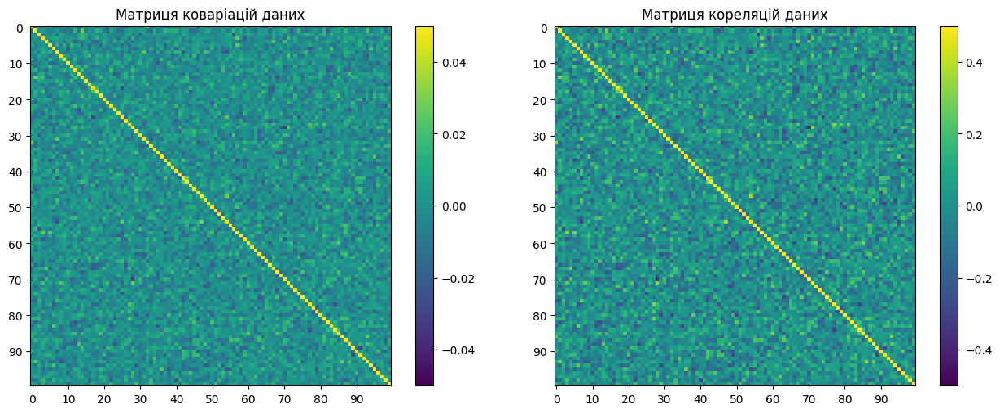

In [3]:
import numpy as np
X = np.random.rand(100,100)
# коваріаційна матриця 
C = np.cov(X,rowvar=False) #рядки-спостереження, стовпці-змінні
# стандартні відхилення
sigma = np.sqrt(np.diag(C))
# діагональна матриця взаємообернених стандартних відхилень
S = np.diag(1 / sigma)
# матриця кореляцій

R = S @ C @ S
#print("Випадкові цілі числа X:\n", X)
#print("\nКоваріаційна матриця C:\n", np.round(C, 2))
#print("\nСтандартні відхилення sigma:\n", np.round(sigma, 2))
#print("\nМатриця кореляцій R:\n", np.round(R, 2))

vlims = [(-0.05, 0.05), (-0.5, 0.5)]
plt.figure(figsize=(13,5))
for i, (mat_title, vlim) in enumerate(zip([(C, 'Матриця коваріацій даних'), (R, 'Матриця кореляцій даних')], vlims), 1):
    mat, title = mat_title
    plt.subplot(1, 2, i)
    
    plt.imshow(mat, cmap='viridis', interpolation='nearest', vmin=vlim[0], vmax=vlim[1])
    plt.colorbar()
    plt.title(title)
    
    # Підписи осей з кроком ~10
    step_x = max(mat.shape[1] // 10, 1)
    step_y = max(mat.shape[0] // 10, 1)
    plt.xticks(np.arange(0, mat.shape[1], step_x))
    plt.yticks(np.arange(0, mat.shape[0], step_y))

plt.tight_layout()
plt.show()

### Завдання 2

<Figure size 1300x500 with 0 Axes>

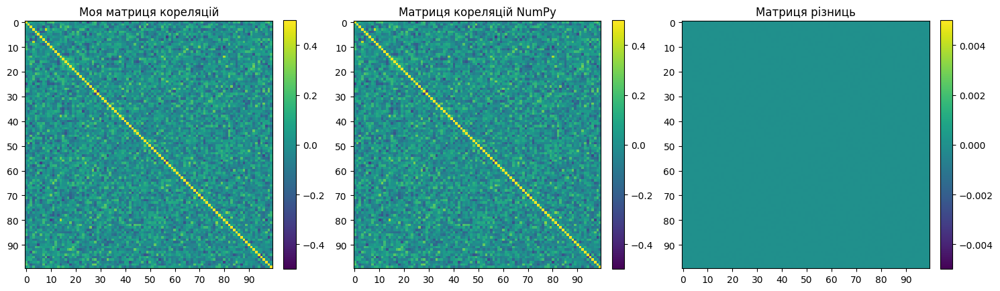

In [3]:
np.random.seed(0)
A = np.random.randn(100, 100)
#обчислення кореляції (функція)
A_corr_matrix = np.corrcoef(A,rowvar=False)
#обчислення кореляції (власний метод)
A_mean = np.mean(A, axis=0,)
A_centered = A - A_mean
A_centered2 = A_centered ** 2
numerator = A_centered.T @ A_centered
denominator = np.sqrt(A_centered2.sum(axis=0)[:, None] * A_centered2.sum(axis=0))
A_corr_matrix_my = numerator / denominator

#Z = (A - A.mean(axis=0)) / A.std(axis=0, ddof=0)
#R = Z.T @ Z
plt.figure(figsize=(13,5))
vlims = [(-0.5, 0.5), (-0.5, 0.5), (-0.005, 0.005)]  # остання для різниць, можна трохи вузькі межі

# Візуалізація
plt.figure(figsize=(15, 7))

for i, (mat_title, vlim) in enumerate(zip([
        (A_corr_matrix_my, 'Моя матриця кореляцій'), 
        (A_corr_matrix, 'Матриця кореляцій NumPy'),
        (A_corr_matrix_my-A_corr_matrix, 'Матриця різниць')],
    vlims), 1):
    
    mat, title = mat_title
    ax = plt.subplot(1, 3, i)
    
    im = ax.imshow(mat, cmap='viridis', interpolation='nearest', vmin=vlim[0], vmax=vlim[1])
    
    # Компактна colorbar
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, shrink=1)
    
    ax.set_title(title)
    
    # Підписи осей з кроком ~10
    step_x = max(mat.shape[1] // 10, 1)
    step_y = max(mat.shape[0] // 10, 1)
    ax.set_xticks(np.arange(0, mat.shape[1], step_x))
    ax.set_yticks(np.arange(0, mat.shape[0], step_y))

plt.tight_layout()
plt.show()

### Завдання 3

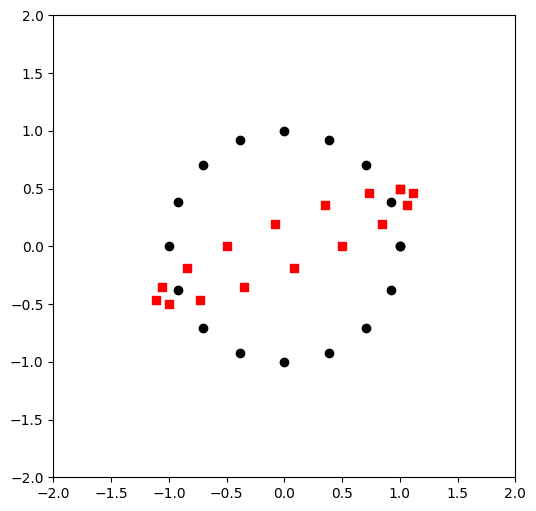

In [4]:
t = np.linspace(0, 2*np.pi, 17)   
x = np.cos(t)
y = np.sin(t)
T = np.array([[1, 0.5],
              [0.5, 0]])
new = T @ np.vstack([x, y])

plt.figure(figsize=(6,6))
plt.gca().set_aspect('equal', adjustable='box')
plt.scatter(x, y, color="black")    
plt.scatter(new[0], new[1], color="red", marker="s")
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()


In [31]:
%matplotlib notebook

x = np.linspace(0, 2*np.pi, 100)
y = np.cos(x)

def transform_y(y, phi):
    T = np.array([
        [1 - phi/3, 0],
        [0, phi]])
    pts = np.vstack((np.zeros_like(y), y))  # x=0, y=y
    new_pts = T @ pts
    return new_pts[1] 

fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlim(0, 2*np.pi)
ax.set_ylim(-2, 2)

orig_plot, = ax.plot([], [], 'ko', markersize=4, label="original")
trans_plot, = ax.plot([], [], 'ro', markersize=4, label="transformed")
ax.legend()
phis = np.linspace(-1, 1, 200)

def update(frame):
    phi = phis[frame]
    k = min(frame, len(x))
    orig_plot.set_data(x[:k], y[:k])
    y_tr = transform_y(y, phi)
    trans_plot.set_data(x[:k], y_tr[:k])
    return orig_plot, trans_plot

anim = FuncAnimation(fig, update, frames=len(phis), interval=100, blit=True)
HTML(anim.to_jshtml())



<IPython.core.display.Javascript object>

In [33]:

from matplotlib.animation import FuncAnimation
%matplotlib notebook

x = np.linspace(0, 2*np.pi, 100)
y = np.cos(x)
points = np.vstack((x, y))  

def apply_transform(points, phi):
    T = np.array([
        [1 - phi/3, 0],
        [0, phi]
    ])
    return T @ points       
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlim(-1, 7)   
ax.set_ylim(-2, 2)

orig_plot, = ax.plot([], [], 'ko', markersize=4, label="original")
trans_plot, = ax.plot([], [], 'ro', markersize=4, label="transformed")

ax.legend()

phis = np.linspace(-1, 1, 200)

def update(frame):
    phi = phis[frame]
    k = min(frame+1, points.shape[1])
    orig_plot.set_data(points[0, :k], points[1, :k])
    trans = apply_transform(points[:, :k], phi)
    trans_plot.set_data(trans[0], trans[1])
    return orig_plot, trans_plot

anim = FuncAnimation(fig, update, frames=len(phis), interval=40, blit=True)
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>

### Завдання 5

C:\Users\Andriy\AppData\Local\Temp\ipykernel_13328\1447226964.py:12: RuntimeWarning: divide by zero encountered in divide
  kernel = kernel / np.sum(kernel)
C:\Users\Andriy\AppData\Local\Temp\ipykernel_13328\1447226964.py:24: RuntimeWarning: invalid value encountered in cast
  smoothed_uint8 = np.clip(smoothed, 0, 255).astype(np.uint8)


(np.float64(-0.5), np.float64(734.5), np.float64(979.5), np.float64(-0.5))

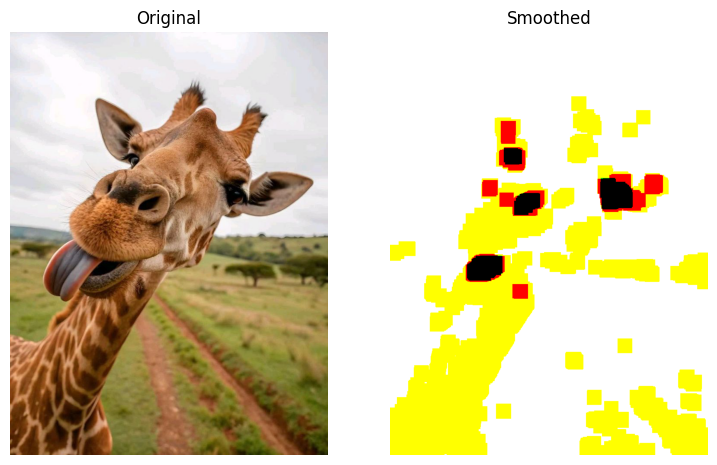

In [9]:
%matplotlib inline

img = io.imread("lab6.png")

def gaussian_kernel(N):
    if N % 2 == 0:
        raise ValueError("Розмір ядра N повинен бути непарним числом")
    row = np.array([1])
    for i in range(1, N):
        row = np.append(row, row[-1] * (N-i) // i)
    kernel = np.outer(row, row)
    kernel = kernel / np.sum(kernel)
    return kernel

N = 33
kernel = gaussian_kernel(N)

# згладжуємо кожен канал
smoothed = np.zeros_like(img, dtype=np.float64)
for i in range(3):
    smoothed[:, :, i] = convolve2d(img[:, :, i], kernel, mode='same', boundary='symm')

# конвертуємо назад у uint8
smoothed_uint8 = np.clip(smoothed, 0, 255).astype(np.uint8)

plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(img)
plt.axis("off")
plt.subplot(1,2,2)
plt.title("Smoothed")
plt.imshow(smoothed_uint8)
plt.axis("off")

### Завдання 6

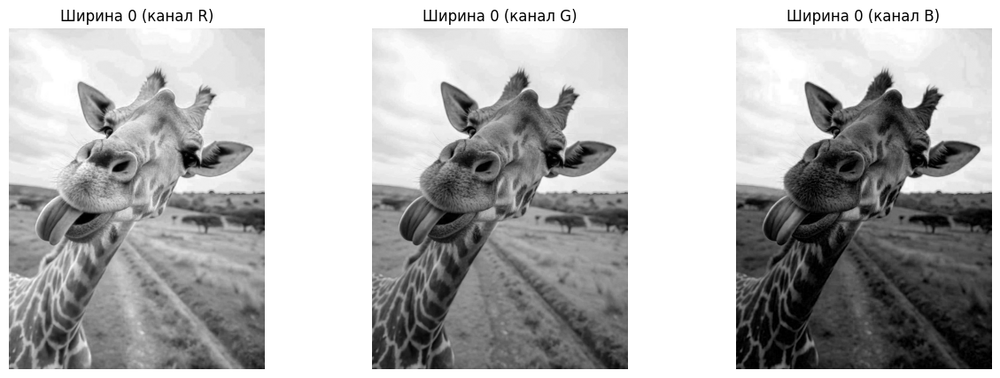

In [16]:
img = io.imread("lab6.png").astype(np.float64)
sigmas = [0, 0, 0]
channels = ['R', 'G', 'B']
plt.figure(figsize=(15,5))

for i, (sigma, name) in enumerate(zip(sigmas, channels)):
    smoothed_channel = gaussian_filter(img[..., i], sigma=sigma)
    smoothed_channel_uint8 = np.clip(smoothed_channel, 0, 255).astype(np.uint8)
    
    # Візуалізація
    plt.subplot(1, 3, i+1)
    plt.title(f"Ширина {sigma} (канал {name})")
    plt.imshow(smoothed_channel_uint8,cmap='grey')  
    plt.axis('off')

plt.show()